# Tennis like the Tennis Pros (Swing) - Eric Li

## Method to Display MP4

In [1]:
def mp4_to_html(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

## Analyze Pose Angles

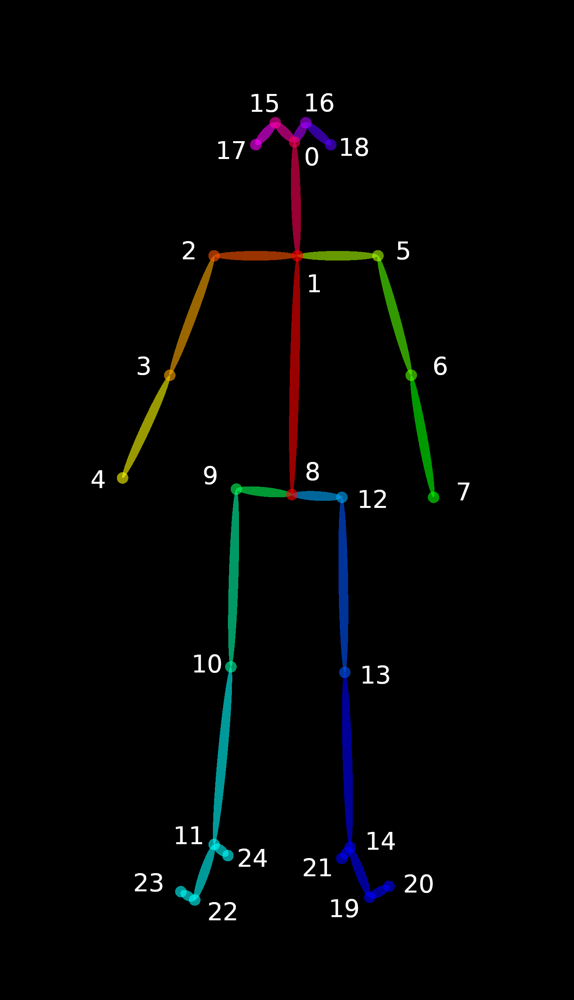

In [2]:
from IPython.display import Image
Image(filename='./images/keypoints_pose_25.png',width=326,height=630.5) 

### Import Packages

In [3]:
import os
import json
import matplotlib.pyplot as plt
import numpy as np
import math
from statistics import mean

from IPython.display import display

### Pose 1 - Roger Federer

Number of frames: 60
Frames read: 60


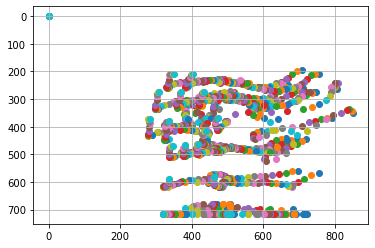

Selected frames with dominant arm: 22


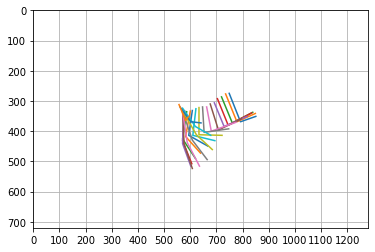

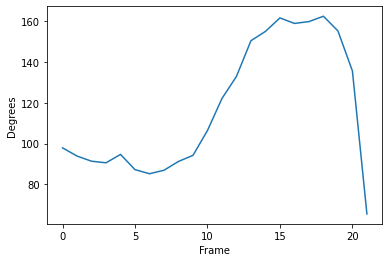

Mean Arm Angle: 117.25542881753758


In [5]:
## Display Video
display(mp4_to_html('./videos/fed-pose1.mp4', width=480, height=360))

## Determine Filepath
filepath = './pose_output/fed-pose1/openpose/short_output/'
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 900
ylimtop = 720
ylimbot = 100

pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is in primary portion of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_1 = []

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue           
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_1.append(angle)

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_1)
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_1))

### Pose 2 - Roger Federer

Number of frames: 60
Frames read: 60


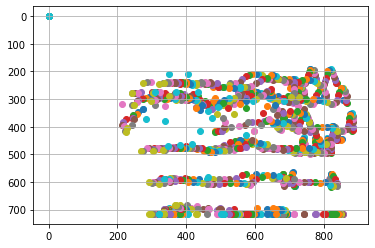

Selected frames with dominant arm: 28


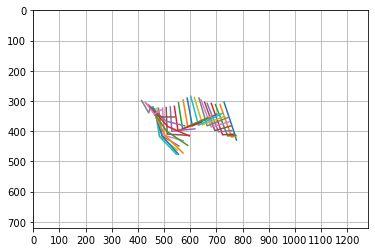

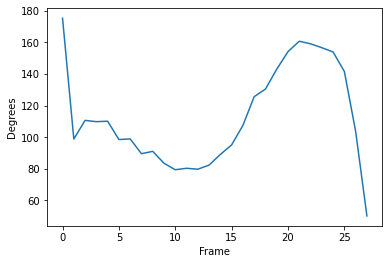

Mean Arm Angle: 112.86634774360259


In [5]:
## Display Video
display(mp4_to_html('fed-pose2.mp4', width=480, height=360))

## Determine Filepath
filepath = './fed-pose2/openpose/short_output/'
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_2 = []

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue            
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_2.append(angle)

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_2)
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_2))

### Pose 3 - Roger Federer

Number of frames: 60
Frames read: 60


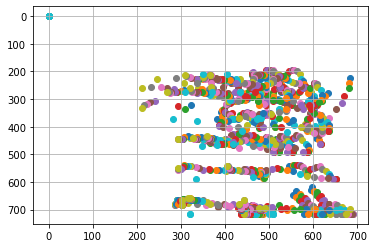

Selected frames with dominant arm: 41


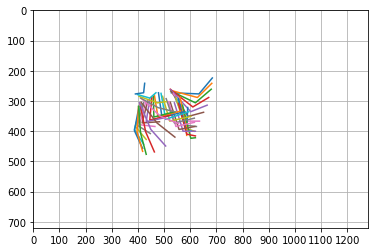

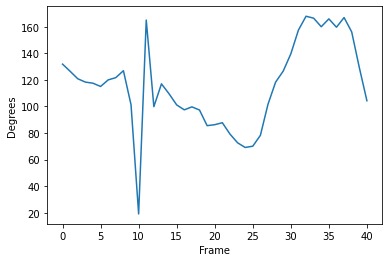

Mean Arm Angle: 115.99769069813463


In [6]:
## Display Video
display(mp4_to_html('fed-pose3.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './fed-pose3/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_3 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue            
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_3.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_3) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_3)) ## Update Here

### Pose 4 - Roger Federer

Number of frames: 60
Frames read: 60


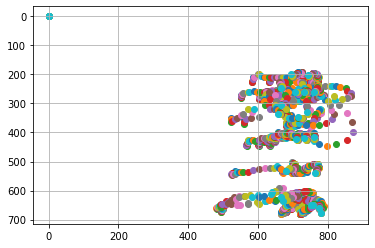

Selected frames with dominant arm: 31


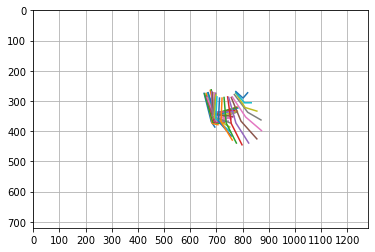

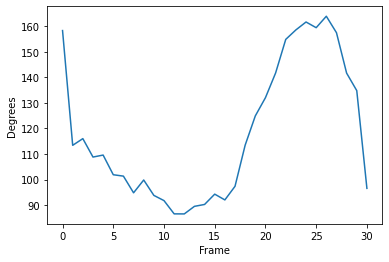

Mean Arm Angle: 118.30863751654833


In [7]:
## Display Video
display(mp4_to_html('fed-pose4.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './fed-pose4/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_4 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue            
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_4.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_4) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_4)) ## Update Here

### Pose 5 - Roger Federer

Number of frames: 120
Frames read: 82


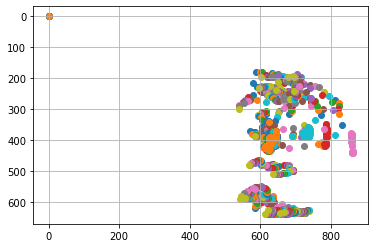

Selected frames with dominant arm: 24


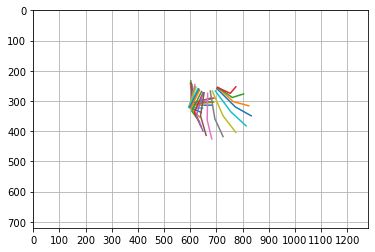

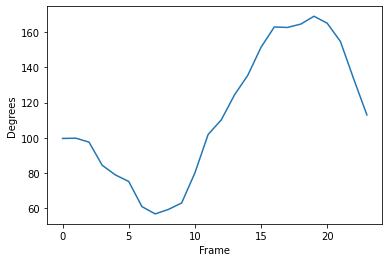

Mean Arm Angle: 112.64817700089257


In [8]:
## Display Video
display(mp4_to_html('fed-pose5.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './fed-pose5/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 550
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_5 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue
            
        ## If shoulder is not level with the rest
        if pose_coordinates[pose]['y'][2] > 300:
            continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_5.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_5) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_5)) ## Update Here

### Roger Federer Initial Summary

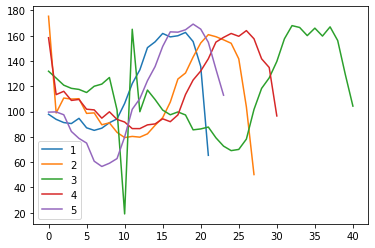

115.52675685249753

In [9]:
plt.plot(arm_angles_1)
plt.plot(arm_angles_2)
plt.plot(arm_angles_3)
plt.plot(arm_angles_4)
plt.plot(arm_angles_5)
plt.legend([1,2,3,4,5])
plt.show()

# mean([mean(arm_angles_1), mean(arm_angles_2), mean(arm_angles_3), mean(arm_angles_4), mean(arm_angles_5)])
mean(arm_angles_1 + arm_angles_2 + arm_angles_3 + arm_angles_4 + arm_angles_5)

### Pose 6 - Novak Djokovic

Number of frames: 60
Frames read: 39


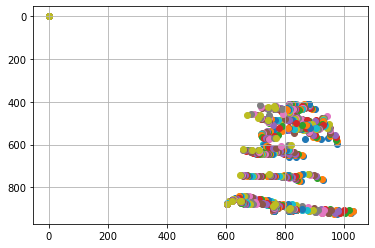

Selected frames with dominant arm: 39


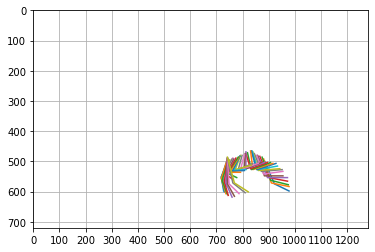

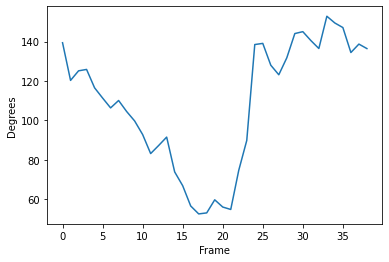

Mean Arm Angle: 108.66374685960909


In [10]:
## Display Video
display(mp4_to_html('djo-pose1.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './djo-pose1/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 700
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_6 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_6.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,1280))
plt.ylim((0,720))
plt.xticks(range(0,1280,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_6) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_6)) ## Update Here

### Retired Poses

In [11]:
### RETIRED - Cannot Effectively Capture Player

# ## Display Video
# display(mp4_to_html('djo-pose2.mp4', width=480, height=360)) ## Update Here

# ## Determine Filepath
# filepath = './djo-pose2/openpose/short_output/' ## Update Here
# files = os.listdir(filepath)
# print("Number of frames:", len(files))

# ## Read for primary person's pose coordinates
# xlimleft = 650
# xlimright = 800
# ylimtop = 720
# ylimbot = 100

# ## Debugging
# pose_coordinates = {}
# person_count = 0

# for file in files:
#     f = open(filepath + str(file))
#     data = json.load(f)
#     f.close()

#     for person in data['people']:
#         keypoints = person['pose_keypoints_2d']
        
#         # If body is not in peripherary of the video...
#         if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
#             x = []
#             y = []
#             confidence = []
#             for i in range(len(keypoints)):
#                 if i % 3 == 0:
#                     x.append(keypoints[i])
#                 elif i % 3 == 1:
#                     y.append(keypoints[i])
#                 else:
#                     confidence.append(keypoints[i])
#             pose_coordinates[person_count] = {}
#             pose_coordinates[person_count]['x'] = x
#             pose_coordinates[person_count]['y'] = y
#             pose_coordinates[person_count]['confidence'] = confidence
#             person_count += 1

# ## Debugging
# # print(data['people'])
# # print(pose_coordinates)

# ## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
# for pose in pose_coordinates:
#     plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

# if person_count > len(files):
#     # plt.legend(range(person_count))
#     print("Warning! More people than frames:", person_count)
# else:
#     print("Frames read:", person_count)

# # plt.xlim((-10,1300))
# # plt.ylim((-10,800))
# plt.grid(visible=True)
# plt.gca().invert_yaxis()
# plt.show()

# ## Plot arm and calculate arm angles
# frames_with_arm = 0

# vector1_array = []
# vector2_array = []
# arm_angles_7 = [] ## Update Here

# for pose in pose_coordinates:
#     if 0 not in pose_coordinates[pose]['x'][2:5]:
#         ## Eliminate if pose hand is left of elbow
#         if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
#             continue
            
#         # ## If shoulder is not level with the rest
#         # if pose_coordinates[pose]['y'][2] > 300:
#         #     continue
        
#         ## Visualize Arm Angle
#         plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
#         frames_with_arm += 1
        
#         ## Calculating Arm Angle
#         vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
#         vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
#         vector1_normal = vector1 / np.linalg.norm(vector1)
#         vector2_normal = vector2 / np.linalg.norm(vector2)
#         dot_product = np.dot(vector1_normal, vector2_normal)
#         angle = math.degrees(np.arccos(dot_product))

#         vector1_array.append(vector1_normal)
#         vector2_array.append(vector2_normal)
#         arm_angles_7.append(angle) ## Update Here

# print("Selected frames with dominant arm:", frames_with_arm)

# ## Visualize arm angle
# plt.xlim((0,1280))
# plt.ylim((0,720))
# plt.xticks(range(0,1280,100))
# plt.grid(visible=True)
# plt.gca().invert_yaxis()
# plt.show()

# ## Plot arm angle
# plt.plot(arm_angles_7) ## Update Here
# plt.xlabel('Frame')
# plt.ylabel('Degrees')
# plt.show()
# print("Mean Arm Angle:", mean(arm_angles_7)) ## Update Here

In [12]:
### RETIRED - Cannot Effectively Capture Player

# ## Display Video
# display(mp4_to_html('djo-pose3.mp4', width=480, height=360)) ## Update Here

# ## Determine Filepath
# filepath = './djo-pose3/openpose/short_output/' ## Update Here
# files = os.listdir(filepath)
# print("Number of frames:", len(files))

# ## Read for primary person's pose coordinates
# xlimleft = 0
# xlimright = 900
# ylimtop = 720
# ylimbot = 100

# ## Debugging
# pose_coordinates = {}
# person_count = 0

# for file in files:
#     f = open(filepath + str(file))
#     data = json.load(f)
#     f.close()

#     for person in data['people']:
#         keypoints = person['pose_keypoints_2d']
        
#         # If body is not in peripherary of the video...
#         if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
#             x = []
#             y = []
#             confidence = []
#             for i in range(len(keypoints)):
#                 if i % 3 == 0:
#                     x.append(keypoints[i])
#                 elif i % 3 == 1:
#                     y.append(keypoints[i])
#                 else:
#                     confidence.append(keypoints[i])
#             pose_coordinates[person_count] = {}
#             pose_coordinates[person_count]['x'] = x
#             pose_coordinates[person_count]['y'] = y
#             pose_coordinates[person_count]['confidence'] = confidence
#             person_count += 1

# ## Debugging
# # print(data['people'])
# # print(pose_coordinates)

# ## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
# for pose in pose_coordinates:
#     plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

# if person_count > len(files):
#     # plt.legend(range(person_count))
#     print("Warning! More people than frames:", person_count)
# else:
#     print("Frames read:", person_count)

# # plt.xlim((-10,1300))
# # plt.ylim((-10,800))
# plt.grid(visible=True)
# plt.gca().invert_yaxis()
# plt.show()

# ## Plot arm and calculate arm angles
# frames_with_arm = 0

# vector1_array = []
# vector2_array = []
# arm_angles_8 = [] ## Update Here

# for pose in pose_coordinates:
#     if 0 not in pose_coordinates[pose]['x'][2:5]:
#         ## Eliminate if pose hand is left of elbow
#         if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
#             continue
            
#         # ## If shoulder is not level with the rest
#         # if pose_coordinates[pose]['y'][2] > 300:
#         #     continue
        
#         ## Visualize Arm Angle
#         plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
#         frames_with_arm += 1
        
#         ## Calculating Arm Angle
#         vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
#         vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
#         vector1_normal = vector1 / np.linalg.norm(vector1)
#         vector2_normal = vector2 / np.linalg.norm(vector2)
#         dot_product = np.dot(vector1_normal, vector2_normal)
#         angle = math.degrees(np.arccos(dot_product))

#         vector1_array.append(vector1_normal)
#         vector2_array.append(vector2_normal)
#         arm_angles_8.append(angle) ## Update Here

# print("Selected frames with dominant arm:", frames_with_arm)

# ## Visualize arm angle
# plt.xlim((0,1280))
# plt.ylim((0,720))
# plt.xticks(range(0,1280,100))
# plt.grid(visible=True)
# plt.gca().invert_yaxis()
# plt.show()

# ## Plot arm angle
# plt.plot(arm_angles_8) ## Update Here
# plt.xlabel('Frame')
# plt.ylabel('Degrees')
# plt.show()
# print("Mean Arm Angle:", mean(arm_angles_8)) ## Update Here

### Pose 7 - Novak Djokovic

Number of frames: 60
Frames read: 35


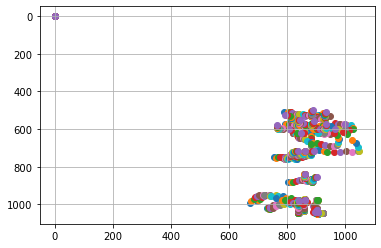

Selected frames with dominant arm: 35


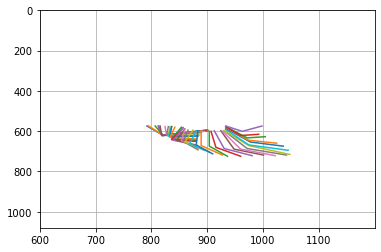

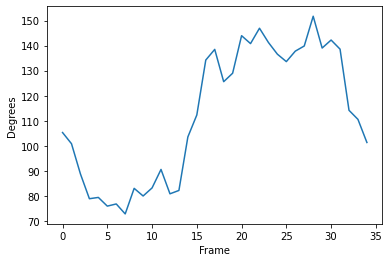

Mean Arm Angle: 112.55738783656518


In [13]:
## Display Video
display(mp4_to_html('djo-pose6.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './djo-pose6/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 800
xlimright = 900
ylimtop = 720
ylimbot = 100

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_7 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_7.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((600,1200))
plt.ylim((0,1080))
plt.xticks(range(600,1200,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_7) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_7)) ## Update Here

### Pose 8 - Novak Djokovic

Number of frames: 60
Frames read: 60


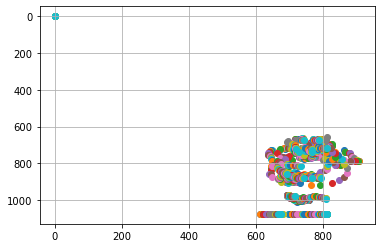

Selected frames with dominant arm: 12


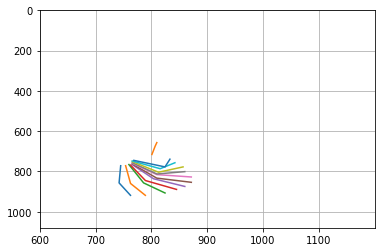

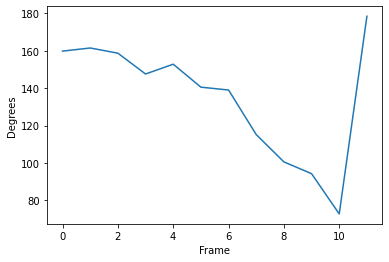

Mean Arm Angle: 135.07340962927185


In [14]:
## Display Video
display(mp4_to_html('djo-pose7.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './djo-pose7/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 700
xlimright = 900
ylimtop = 1080
ylimbot = 0

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_8 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3] or pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][2]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_8.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((600,1200))
plt.ylim((0,1080))
plt.xticks(range(600,1200,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_8) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_8)) ## Update Here

### Pose 9 - Novak Djokovic

Number of frames: 60
Frames read: 29


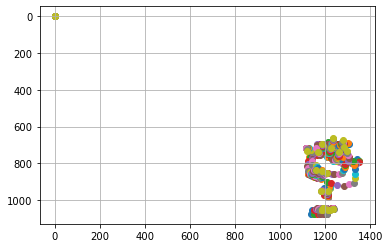

Selected frames with dominant arm: 10


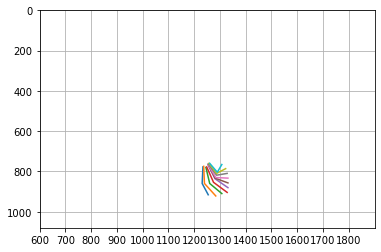

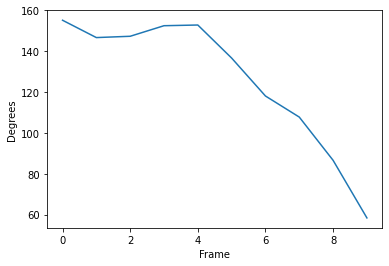

Mean Arm Angle: 126.20117648987765


In [15]:
## Display Video
display(mp4_to_html('djo-pose8.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './djo-pose8/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 1200
xlimright = 1400
ylimtop = 1080
ylimbot = 700

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_9 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3] or pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][2]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_9.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((600,1900))
plt.ylim((0,1080))
plt.xticks(range(600,1900,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_9) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_9)) ## Update Here

### Pose 10 - Novak Djokovic

Number of frames: 60
Frames read: 55


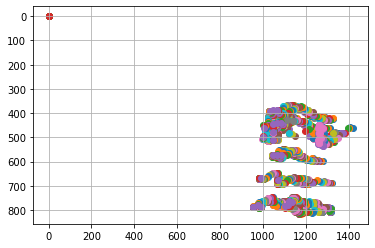

Selected frames with dominant arm: 25


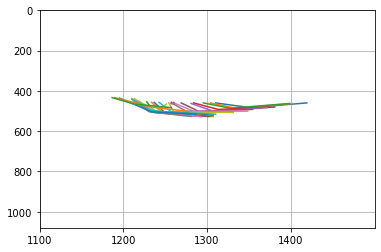

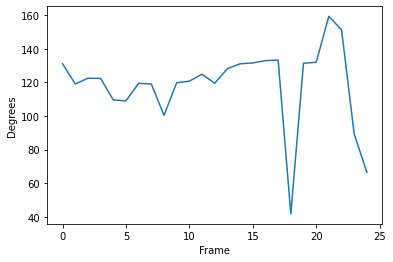

Mean Arm Angle: 118.62430066900875


In [16]:
## Display Video
display(mp4_to_html('djo-pose9.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './djo-pose9/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 1000
xlimright = 1300
ylimtop = 1080
ylimbot = 0

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_10 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3] or pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][2]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_10.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((1100,1500))
plt.ylim((0,1080))
plt.xticks(range(1100,1500,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_10) ## Update Here
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_10)) ## Update Here

## Comparing Arm Angles

Roger Federer raw arm angle:  115.52675685249753


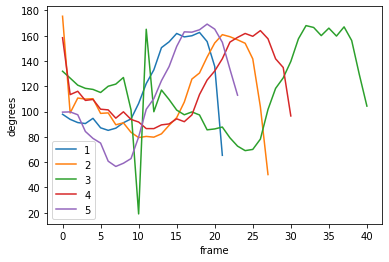

Novak Djokovic raw arm angle: 115.71881790496728


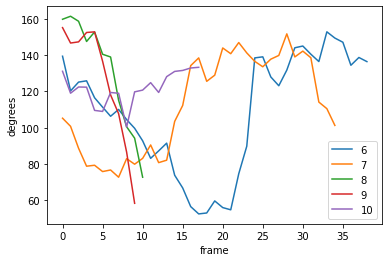

Roger Federer peak arm angle:  164.88919083623648


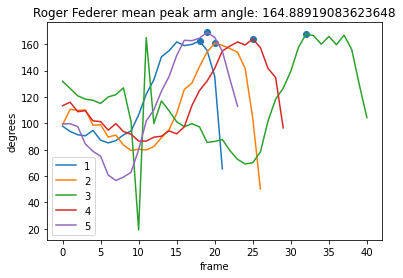

Novak Djokovic peak arm angle: 150.9009405596083


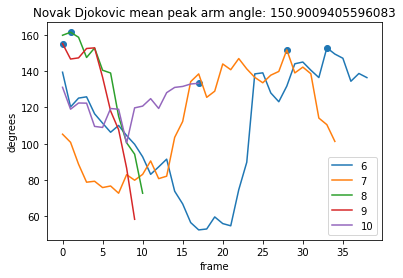

In [17]:
fed_mean = mean(arm_angles_1 + arm_angles_2 + arm_angles_3 + arm_angles_4 + arm_angles_5)
print("Roger Federer raw arm angle: ", fed_mean)

plt.plot(arm_angles_1)
plt.plot(arm_angles_2)
plt.plot(arm_angles_3)
plt.plot(arm_angles_4)
plt.plot(arm_angles_5)
plt.legend([1,2,3,4,5])
plt.xlabel('frame')
plt.ylabel('degrees')
plt.show()

djo_mean = mean(arm_angles_6 + arm_angles_7 + arm_angles_8[0:-1] + arm_angles_9 + arm_angles_10[0:18])
print("Novak Djokovic raw arm angle:", djo_mean)

plt.plot(arm_angles_6)
plt.plot(arm_angles_7)
plt.plot(arm_angles_8[0:-1])
plt.plot(arm_angles_9)
plt.plot(arm_angles_10[0:18])
plt.legend([6,7,8,9,10])
plt.xlabel('frame')
plt.ylabel('degrees')
plt.show()

peak1 = np.argmax(arm_angles_1)
peak2 = np.argmax(arm_angles_2[1::])
peak3 = np.argmax(arm_angles_3)
peak4 = np.argmax(arm_angles_4[1::])
peak5 = np.argmax(arm_angles_5)
fed_peak_vals = [arm_angles_1[peak1], arm_angles_2[peak2 + 1], arm_angles_3[peak3], arm_angles_4[peak4 + 1], arm_angles_5[peak5]]
fed_peak = mean(fed_peak_vals)
print("Roger Federer peak arm angle: ", fed_peak)

plt.plot(arm_angles_1)
plt.plot(arm_angles_2[1::])
plt.plot(arm_angles_3)
plt.plot(arm_angles_4[1::])
plt.plot(arm_angles_5)
plt.legend([1,2,3,4,5])
plt.scatter([peak1, peak2, peak3, peak4, peak5], fed_peak_vals)
plt.title('Roger Federer mean peak arm angle: ' + str(fed_peak))
plt.xlabel('frame')
plt.ylabel('degrees')
plt.show()

peak6 = np.argmax(arm_angles_6)
peak7 = np.argmax(arm_angles_7)
peak8 = np.argmax(arm_angles_8[0:-1])
peak9 = np.argmax(arm_angles_9)
peak10 = np.argmax(arm_angles_10[0:18])
djo_peak_vals = [arm_angles_6[peak6], arm_angles_7[peak7], arm_angles_8[peak8], arm_angles_9[peak9], arm_angles_10[peak10]]
djo_peak = mean(djo_peak_vals)
print("Novak Djokovic peak arm angle:", djo_peak)

plt.plot(arm_angles_6)
plt.plot(arm_angles_7)
plt.plot(arm_angles_8[0:-1])
plt.plot(arm_angles_9)
plt.plot(arm_angles_10[0:18])
plt.legend([6,7,8,9,10])
plt.scatter([peak6, peak7, peak8, peak9, peak10], djo_peak_vals)
plt.title('Novak Djokovic mean peak arm angle: ' + str(djo_peak))
plt.xlabel('frame')
plt.ylabel('degrees')
plt.show()



## User Data

### Pose 1 - User Data

Number of frames: 120
Frames read: 120


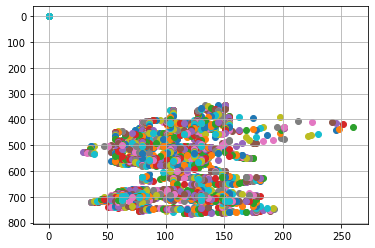

Selected frames with dominant arm: 91


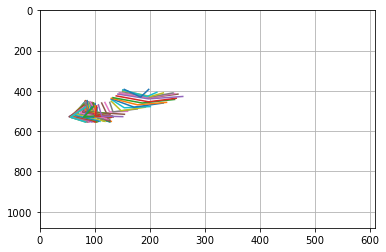

Peak Arm Angle: 146.25073084861347


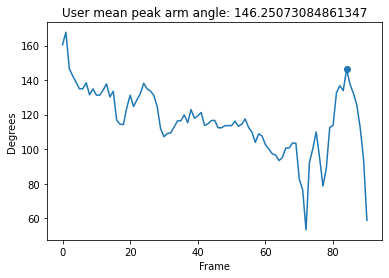

Mean Arm Angle: 116.69747472466969


In [18]:
## Display Video
display(mp4_to_html('user-pose1.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './user-pose1/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 608
ylimtop = 1080
ylimbot = 0

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_user1 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3] or pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][2]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_user1.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,608))
plt.ylim((0,1080))
plt.xticks(range(0,608,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_user1) ## Update Here

peak_user_1 = np.argmax(arm_angles_user1[3::])
user_peak_1 = arm_angles_user1[peak_user_1 + 3]
plt.scatter(peak_user_1 + 3, user_peak_1)
print("Peak Arm Angle:", user_peak_1)
plt.title('User mean peak arm angle: ' + str(user_peak_1))
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_user1)) ## Update Here



In [19]:
## Attempt at animation
# %matplotlib widget

In [20]:
## Attempt at animation

# import matplotlib.animation as animation
# fig, ax = plt.subplots()

# line, = ax.plot(pose_coordinates[0]['x'][2:5], pose_coordinates[0]['y'][2:5])

# def animate(i):
#     line.set_xdata(pose_coordinates[i]['x'][2:5])
#     line.set_ydata(pose_coordinates[i]['y'][2:5])
#     return line


# anim = animation.FuncAnimation(
#     fig, animate, interval=5, frames=100)

# video = anim.to_html5_video()
# html = display.HTML(video)
# display.display(html)
# plt.close()

### Pose 2 - User Data (RETIRED)

Number of frames: 120
Frames read: 120


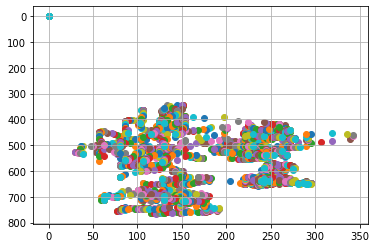

Selected frames with dominant arm: 61


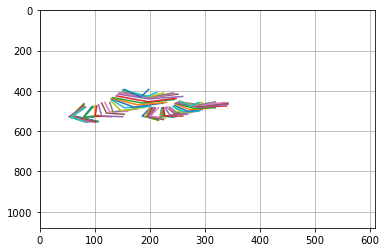

Peak Arm Angle: 157.30098074570927


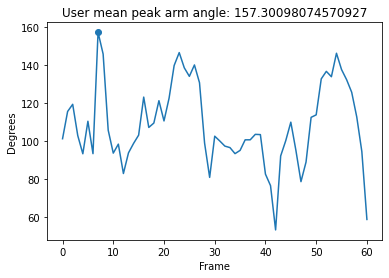

Mean Arm Angle: 108.69095139072238


In [21]:
## Display Video
display(mp4_to_html('user-pose2.mp4', width=480, height=360)) ## Update Here

## Determine Filepath
filepath = './user-pose2/openpose/short_output/' ## Update Here
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 100
xlimright = 608
ylimtop = 1080
ylimbot = 0

## Debugging
pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    # plt.legend(range(person_count))
    print("Warning! More people than frames:", person_count)
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0

vector1_array = []
vector2_array = []
arm_angles_user2 = [] ## Update Here

for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        ## Eliminate if pose hand is left of elbow
        if pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][3] or pose_coordinates[pose]['x'][4] < pose_coordinates[pose]['x'][2]:
            continue
            
        # ## If shoulder is not level with the rest
        # if pose_coordinates[pose]['y'][2] > 300:
        #     continue
        
        ## Visualize Arm Angle
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1
        
        ## Calculating Arm Angle
        vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
        vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
        vector1_normal = vector1 / np.linalg.norm(vector1)
        vector2_normal = vector2 / np.linalg.norm(vector2)
        dot_product = np.dot(vector1_normal, vector2_normal)
        angle = math.degrees(np.arccos(dot_product))

        vector1_array.append(vector1_normal)
        vector2_array.append(vector2_normal)
        arm_angles_user2.append(angle) ## Update Here

print("Selected frames with dominant arm:", frames_with_arm)

## Visualize arm angle
plt.xlim((0,608))
plt.ylim((0,1080))
plt.xticks(range(0,608,100))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm angle
plt.plot(arm_angles_user2) ## Update Here

peak_user_2 = np.argmax(arm_angles_user2)
user_peak_2 = arm_angles_user2[peak_user_2]
plt.scatter(peak_user_2, user_peak_2)
print("Peak Arm Angle:", user_peak_2)
plt.title('User mean peak arm angle: ' + str(user_peak_2))
plt.xlabel('Frame')
plt.ylabel('Degrees')
plt.show()
print("Mean Arm Angle:", mean(arm_angles_user2)) ## Update Here

